In [57]:
import rasterio
from rasterio.mask import mask
import os, sys
import numpy as np
import sklearn
from sklearn.mixture import BayesianGaussianMixture
import fiona
from matplotlib import pyplot as plt
from scipy.misc import bytescale
from mpl_toolkits.axes_grid1 import make_axes_locatable

SMALL_SIZE = 16
MEDIUM_SIZE = 18
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

def colorbar(mappable):
    ax = mappable.axes
    fig = ax.figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.15)
    return fig.colorbar(mappable, cax=cax)

## write my own majority filter..
def majority_agg(arr, factor):
    
    # get the ranges of pixels to grab from planet
    row_sets = np.arange(0, arr.shape[0], factor)
    col_sets = np.arange(0, arr.shape[1], factor)
    
    # allocate new array
    new_arr = np.zeros((row_sets.size, col_sets.size))
    for i,r in enumerate(row_sets[:-2]):
        for j,c in enumerate(col_sets[:-2]):
            
            # get the start/stop for the slice
            row_start = int(row_sets[i])
            row_end = int(row_sets[i+1])
            col_start = int(col_sets[j])
            col_end = int(col_sets[j+1])
                        
            #get the pixels
            pixels = arr[row_start:row_end, col_start:col_end]
            
            # get the value (majority)
            val = np.argmax(np.bincount(pixels.ravel()))
            
            new_arr[i,j] = val
    
    return new_arr

# function to plot rgb image with mask
def plot_rgb(arr):
    
    if arr.shape[-1] != 3:
        raise Exception('Input needs to be 3 band, and band channel needs to be last channel')
        
    if type(arr) is np.ma.MaskedArray:
        # build alpha channel        
        mask = np.ma.getmask(arr[:,:,0])
        mask = ~mask * 255
        
        # add the mask to the array (ise earthpy bytescale)
        plot_arr = np.dstack((bytescale(arr),mask))
        
        # plot it
        plt.imshow(plot_arr)
        plt.show()
        
    else: #no mask, no worries
        plt.imshow(plot_arr)
        
    return plot_arr

In [58]:
# specify some shape files
sjer_aoi_shp = '../shp/planet_sub_mosaic_intersect_SJER_AOI.shp'
sjer_bound_shp = '../shp/Export_Output.shp'

# specify some image files for March 12
planet_mar12 = '../march_2017_planet_scenes/20170312_180045_0e3a/20170312_180045_0e3a_3B_AnalyticMS_SR.tif'
l8_mar12_base = '../landsat8/SR/LC080420342017031201T1-SC20180503152939/LC08_L1TP_042034_20170312_20170317_01_T1_sr_'
l8_mar12_bands = [l8_mar12_base + b + '.tif' for b in ['band2', 'band3', 'band4', 'band5']]
l8_mar12_bands

nclass=5

In [59]:
## load images as numpy arrays
# load aoi
with fiona.open(sjer_aoi_shp, "r") as shapefile:
    geoms = [feature["geometry"] for feature in shapefile]

# first planet
with rasterio.open(planet_mar12, 'r') as src:
    pl_arr = mask(src, geoms, crop=True, nodata=0, all_touched=True)[0]
    
# move bands to back
pl_arr = np.rollaxis(pl_arr, 0,3)
    
# then landsat
l_ls = []
for lb in l8_mar12_bands:
    with rasterio.open(lb, 'r') as src:
        temp_arr = mask(src, geoms, crop=True, nodata=0, all_touched=True)[0].squeeze()
    
    l_ls.append(temp_arr)

# make list to array and roll bands to back
l8_arr = np.ma.array(l_ls)
l8_arr = np.rollaxis(l8_arr, 0,3)

## explicitly set the mask
l8_arr = np.ma.masked_equal(l8_arr, 0).astype('float32')/10000.
pl_arr = np.ma.masked_equal(pl_arr, 0).astype('float32')/10000.

pl_rgb = pl_arr[:,:,[2,1,0]]
l8_rgb = l8_arr[:,:,[2,1,0]]



### train a K means classifier on PlanetScope 4-band SR data, and apply to Landsat 8 (4 bands)

In [90]:
# fit it on the first image
X_pl =  pl_arr.reshape(-1,4)

## try to remove mask values to see if they have any influence
mask = np.ma.getmask(X_pl[:,0])
mask_inds = np.where(X_pl[:,0] >0)[0]
# X_pl[~mask].shape, X_pl.shape, mask_inds.shape

# assign an array for clustering
X_pl_c = X_pl[mask_inds,:]

# set the use-mask flag
use_mask=True



((4071062,), (5797230,))

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\sklearn\mixture\base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
C:\anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel\__main__.py:71: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.


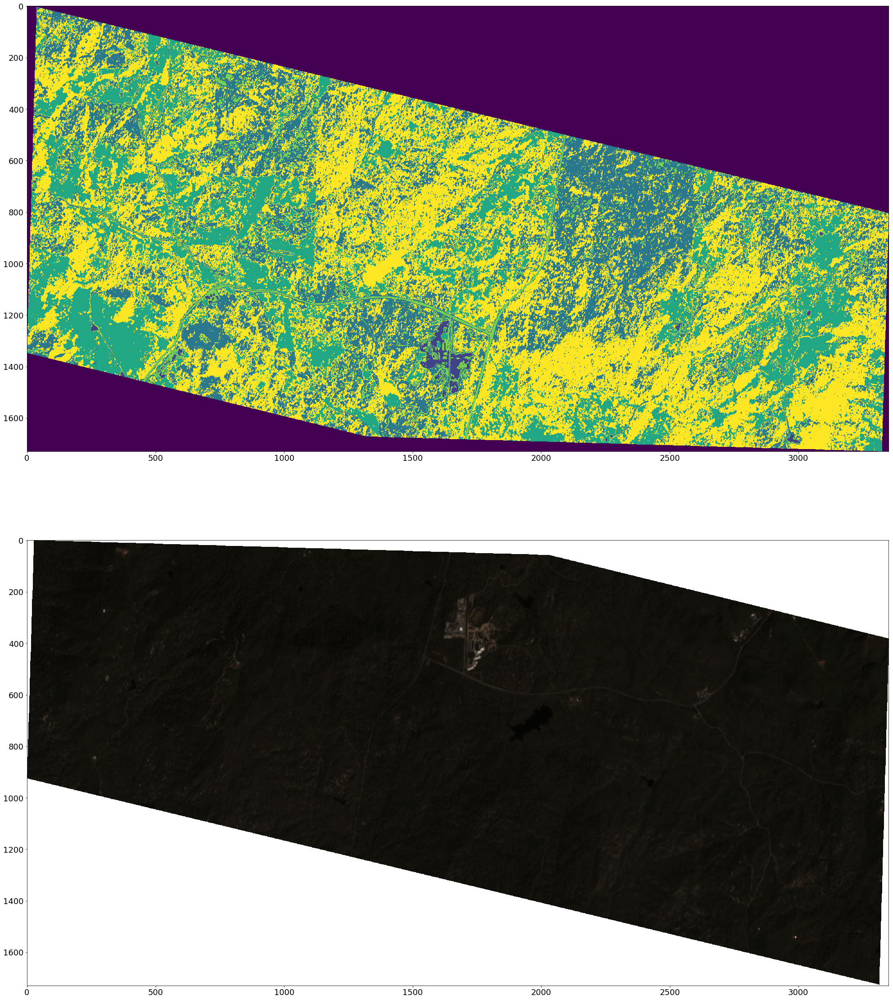

In [91]:
# Define the classifier
clf_pl = BayesianGaussianMixture(n_components=nclass, random_state=10)

# ndvi = np.expand_dims(((TestData[:,3] - TestData[:,2]) / (TestData[:,3] + TestData[:,2])), axis=1)
# ndvi[np.isnan(ndvi)] = -9999
#TestData = np.hstack((TestData, ndvi))

if not use_mask:
    clf_pl.fit(X_pl, y=None)

    # use the fit model
    predictedClass = clf_pl.predict(X_pl)
    predictedClass += 1
    
    # reshape to array
    pred_data_pl_pl = predictedClass.reshape(pl_arr.shape[:2])
    
else:
    clf_pl.fit(X_pl_c, y=None)

    # use the fit model
    predictedClass = clf_pl.predict(X_pl_c)
    predictedClass += 1
    predictedClass = np.expand_dims(predictedClass, axis=-1)
    
    # reshape to array
    pred_data_pl_pl = np.zeros((X_pl.shape[0], 1))
    pred_data_pl_pl[~mask_inds] = predictedClass
    pred_data_pl_pl = pred_data_pl_pl.reshape(pl_arr.shape[:2])

## show the result
fig, ax = plt.subplots(2,1, figsize = (40,40))
ax[0].imshow(pred_data_pl_pl)
ax[1].imshow(plot_rgb(pl_rgb))
plt.show()

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel\__main__.py:71: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.


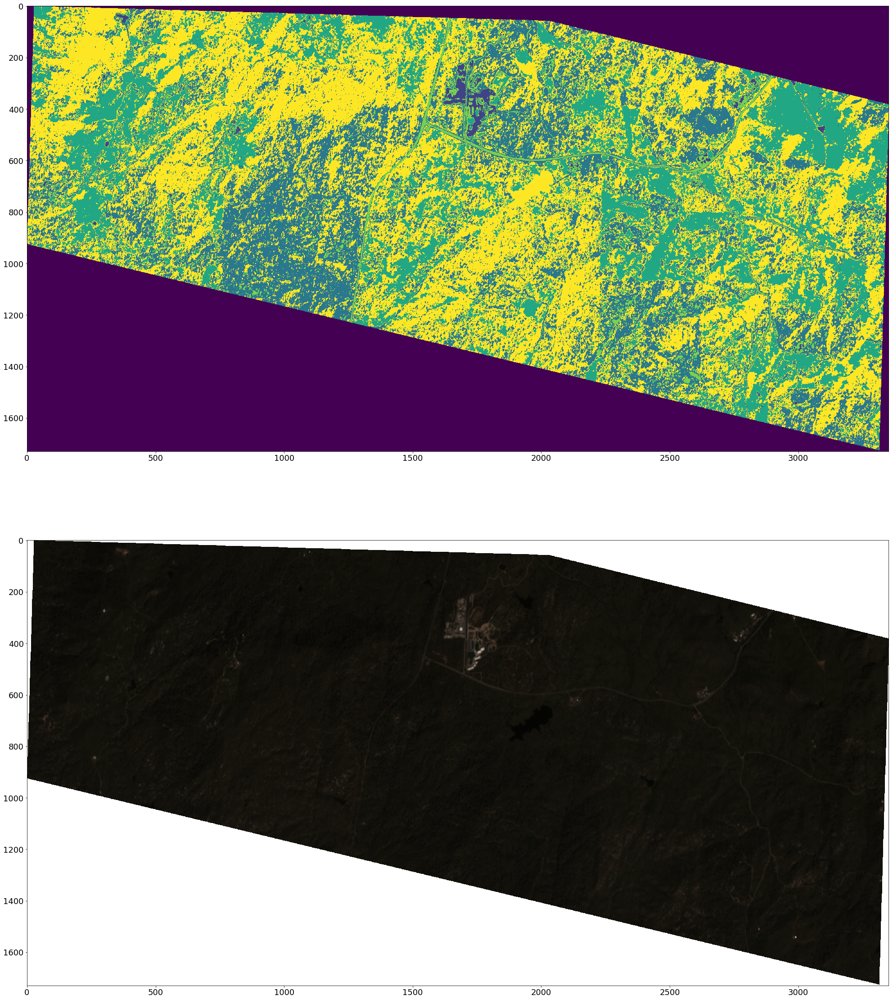

In [100]:
# reshape to array
pred_data_pl_pl = np.zeros((X_pl.shape[0], 1))
pred_data_pl_pl[~mask_inds] = predictedClass
pred_data_pl_pl = pred_data_pl_pl.reshape(pl_arr.shape[:2])
pred_data_pl_pl = np.fliplr(np.flipud(pred_data_pl_pl))

## show the result
fig, ax = plt.subplots(2,1, figsize = (40,40))
ax[0].imshow(pred_data_pl_pl)
ax[1].imshow(plot_rgb(pl_rgb))
plt.show()

In [89]:
X_pl_c

masked_array(data =
 [[-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [-- -- -- --]
 [--

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel\__main__.py:71: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.


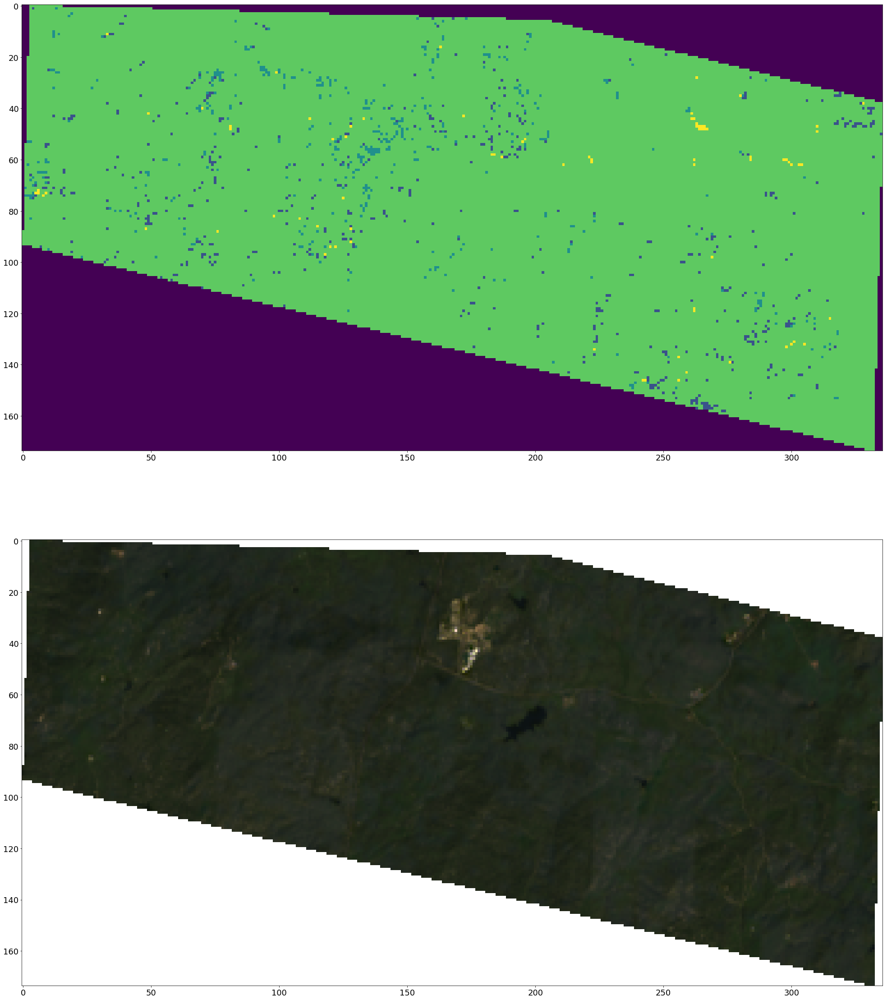

In [33]:
# apply the k means result to the landsat image
X_l8 = l8_arr.reshape(-1,4)

# use the fit model
predictedClass_pl_l8 = clf_pl.predict(X_l8)
predictedClass_pl_l8 += 1

## show the result

fig, ax = plt.subplots(2,1, figsize = (40,40))
pred_data_pl_l8 = predictedClass_pl_l8.reshape(l8_arr.shape[:2])
ax[0].imshow(pred_data_pl_l8)
ax[1].imshow(plot_rgb(l8_rgb))
plt.show()

### Train a k means classifier on Landsat 8 data (4 band), and apply to PlanetScope 4 band SR data

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\sklearn\mixture\base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
C:\anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel\__main__.py:71: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.


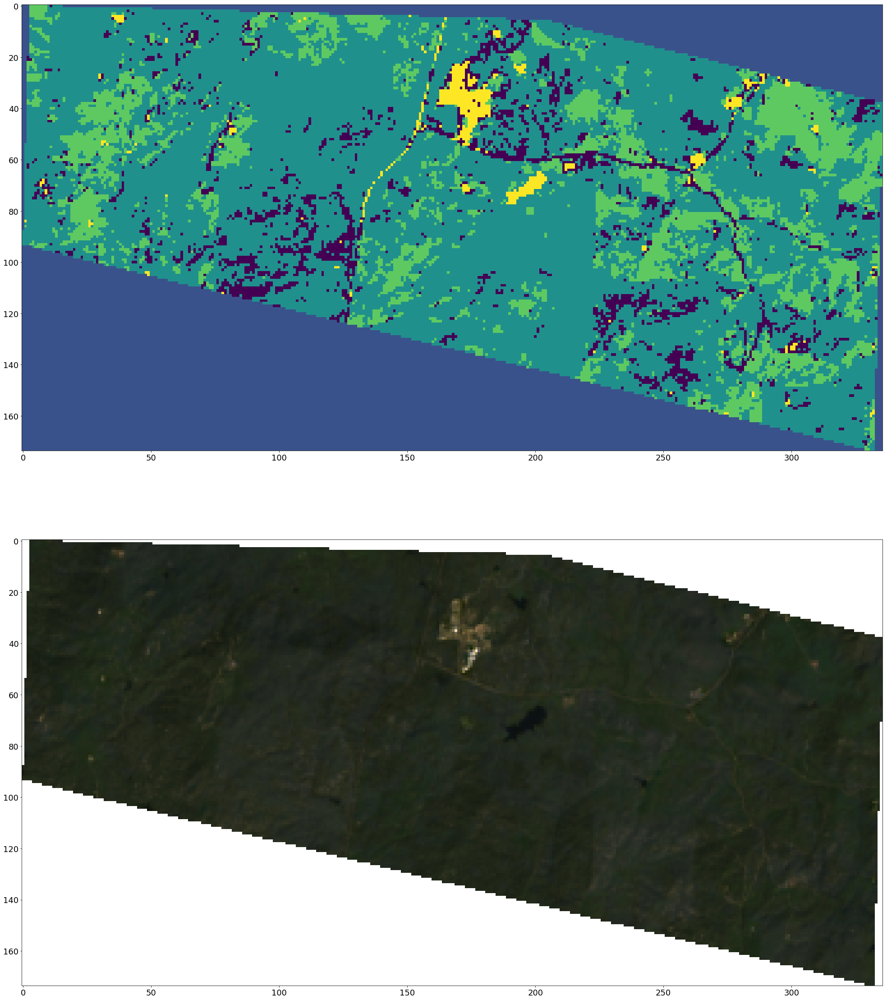

In [34]:
# Define the classifier
clf_l8 = BayesianGaussianMixture(n_components=nclass, random_state=10)

# fit it on the first image
X_l8 =  l8_arr.reshape(-1,4)

# ndvi = np.expand_dims(((TestData[:,3] - TestData[:,2]) / (TestData[:,3] + TestData[:,2])), axis=1)
# ndvi[np.isnan(ndvi)] = -9999
#TestData = np.hstack((TestData, ndvi))
clf_l8.fit(X_l8, y=None)

# use the fit model
predictedClass = clf_l8.predict(X_l8)
predictedClass += 1

## show the result
fig, ax = plt.subplots(2,1, figsize = (40,40))
pred_data_l8_l8 = predictedClass.reshape(l8_arr.shape[:2])
ax[0].imshow(pred_data_l8_l8)
ax[1].imshow(plot_rgb(l8_rgb))
plt.show()

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel\__main__.py:71: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.


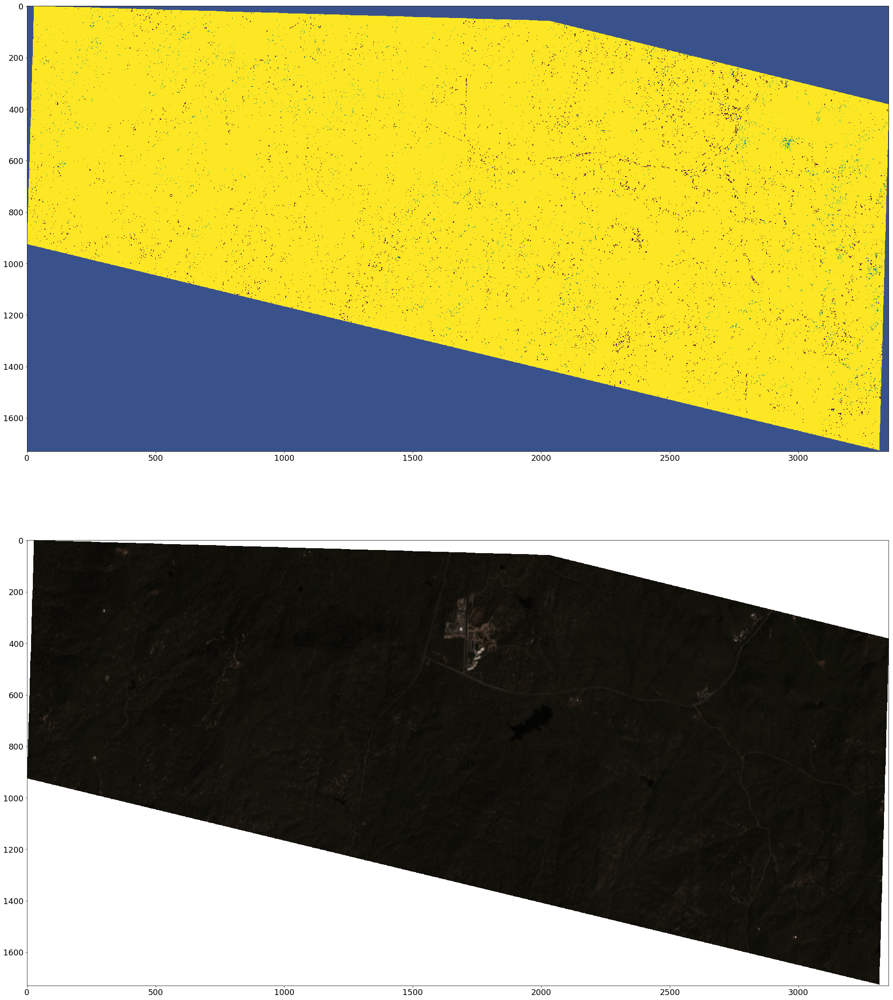

In [35]:
# apply the k means result to the PS image
X_pl = pl_arr.reshape(-1,4)

# use the fit model
predictedClass_l8_pl = clf_l8.predict(X_pl)
predictedClass_l8_pl += 1

## show the result

fig, ax = plt.subplots(2,1, figsize = (40,40))
pred_data_l8_pl = predictedClass_l8_pl.reshape(pl_arr.shape[:2])
ax[0].imshow(pred_data_l8_pl)
ax[1].imshow(plot_rgb(pl_rgb))
plt.show()

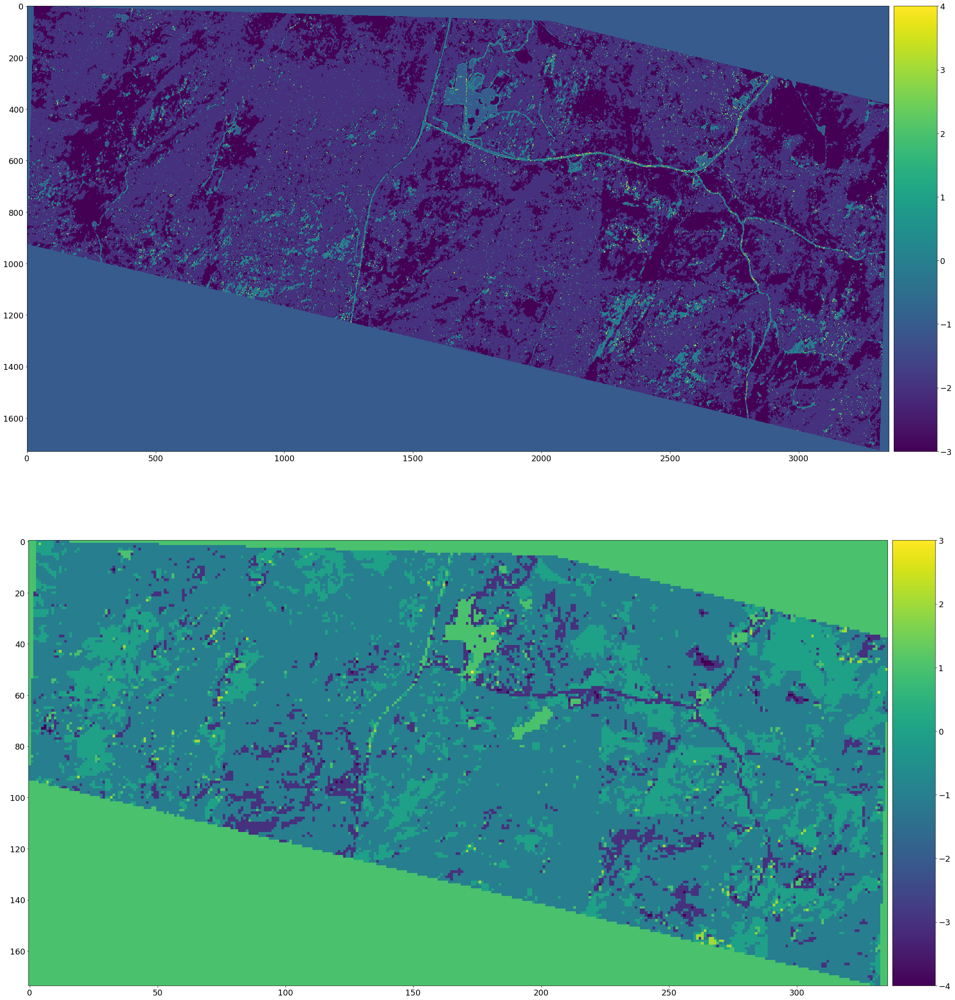

In [36]:
## show the differences between the class maps
pl_dif = pred_data_pl_pl - pred_data_l8_pl
l8_dif = pred_data_l8_l8 - pred_data_pl_l8

fig, ax = plt.subplots(2,1, figsize = (40,40))
c = ax[0].imshow(pl_dif)
colorbar(c)
c = ax[1].imshow(l8_dif)
colorbar(c)
plt.show()

In [37]:
clf_l8

BayesianGaussianMixture(covariance_prior=None, covariance_type='full',
            degrees_of_freedom_prior=None, init_params='kmeans',
            max_iter=100, mean_precision_prior=None, mean_prior=None,
            n_components=5, n_init=1, random_state=10, reg_covar=1e-06,
            tol=0.001, verbose=0, verbose_interval=10, warm_start=False,
            weight_concentration_prior=None,
            weight_concentration_prior_type='dirichlet_process')

In [38]:
clf_pl

BayesianGaussianMixture(covariance_prior=None, covariance_type='full',
            degrees_of_freedom_prior=None, init_params='kmeans',
            max_iter=100, mean_precision_prior=None, mean_prior=None,
            n_components=5, n_init=1, random_state=10, reg_covar=1e-06,
            tol=0.001, verbose=0, verbose_interval=10, warm_start=False,
            weight_concentration_prior=None,
            weight_concentration_prior_type='dirichlet_process')

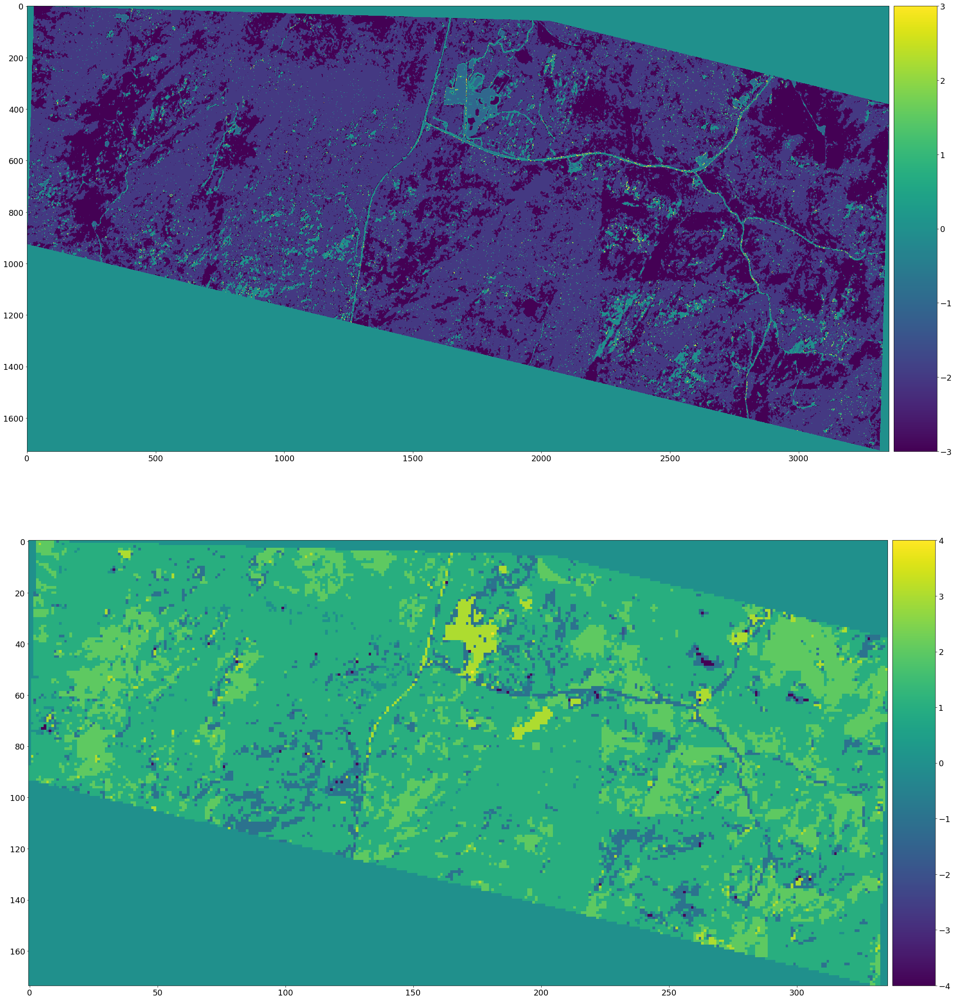

In [39]:
### find the minimum distances between cluster centers for the correct mapping
pl_centers = clf_pl.means_
l8_centers = clf_l8.means_
class_reassign = []
distances = []
for c in pl_centers: 
    # find row in landsat centers closest to current center
    dist = np.linalg.norm(c - l8_centers, axis=1)
    nearest_class = np.argmin(dist)
    class_reassign.append(nearest_class +1)
    distances.append(dist)
    
    
# replace the values from the l8 classifier, with the pl values
class_values = np.unique(pred_data_l8_pl)
pl_copy = pred_data_l8_pl.copy()
for i in class_values:
    
    # reassign values
    ind = i-1
    pl_copy[pred_data_l8_pl == i] = class_reassign[ind]


## do the same for landsat

### find the minimum distances between cluster centers for the correct mapping
pl_centers = clf_pl.means_
l8_centers = clf_l8.means_
class_reassign_l8 = []
for c in l8_centers: 
    # find row in landsat centers closest to current center
    dist = np.linalg.norm(c - pl_centers, axis=1)
    nearest_class = np.argmin(dist)
    class_reassign_l8.append(nearest_class +1)
    
# replace the values from the Planet classifier applied to the L8 scene, with the nearest L8 class values
class_values = np.unique(pred_data_pl_l8)
l8_copy = pred_data_pl_l8.copy()
for i in class_values:
    
    # reassign values
    ind = i-1
    l8_copy[pred_data_pl_l8 == i] = class_reassign_l8[ind]

    
# reshow the difference    
pl_dif = pred_data_pl_pl - pl_copy
l8_dif = pred_data_l8_l8 - l8_copy

fig, ax = plt.subplots(2,1, figsize = (40,40))
c = ax[0].imshow(pl_dif)
colorbar(c)
c = ax[1].imshow(l8_dif)
colorbar(c)
plt.show()

    

# print(distances)



In [40]:
clf_pl.means_ - clf_l8.means_

array([[-0.04713274, -0.07331236, -0.06241892, -0.27602213],
       [ 0.05121395,  0.06933517,  0.07399937,  0.29656185],
       [ 0.00856995,  0.00110056,  0.0190426 , -0.00749162],
       [ 0.08036032,  0.07105704,  0.1115269 , -0.04910347],
       [ 0.00717199, -0.01205667, -0.00274207,  0.03252299]])

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\ipykernel\__main__.py:71: DeprecationWarning: `bytescale` is deprecated!
`bytescale` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.


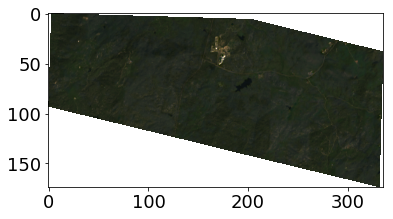

masked_array(data =
 [[[0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]
  ..., 
  [0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]]

 [[0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]
  ..., 
  [0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]]

 [[0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]
  ..., 
  [0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]]

 ..., 
 [[0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]
  ..., 
  [0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]]

 [[0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]
  ..., 
  [0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]]

 [[0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]
  ..., 
  [0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]]],
             mask =
 False,
       fill_value = 999999)

In [41]:
plot_rgb(l8_rgb)

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


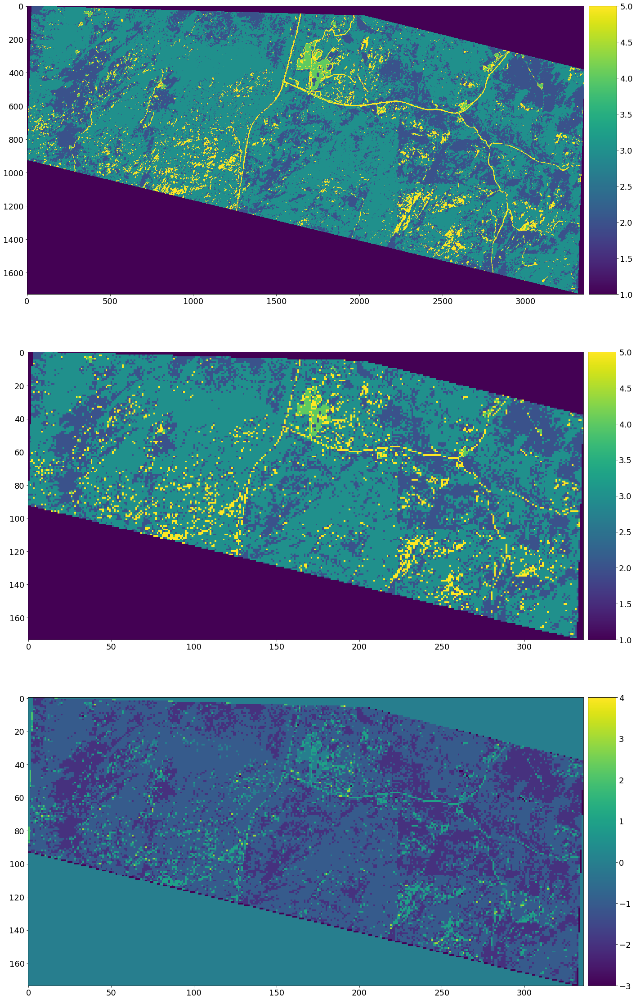

In [42]:
## resample the planet classification result to the landsat version, using the pl and l8 classifier, and difference
from skimage.transform import resize

# pl_dif = pred_data_pl_pl - pl_copy
# l8_dif = pred_data_l8_l8 - l8_copy

pl_resize = resize(pred_data_pl_pl, pred_data_pl_l8.shape, preserve_range=True, order=0) # order=0 is NN

fig, ax = plt.subplots(3,1, figsize = (40,40))
c = ax[0].imshow(pred_data_pl_pl)
colorbar(c)
c = ax[1].imshow(pl_resize)
colorbar(c)
c = ax[2].imshow(pl_resize - pred_data_pl_l8)
colorbar(c)
plt.show()

## do a majority resampling up to landsat resolution

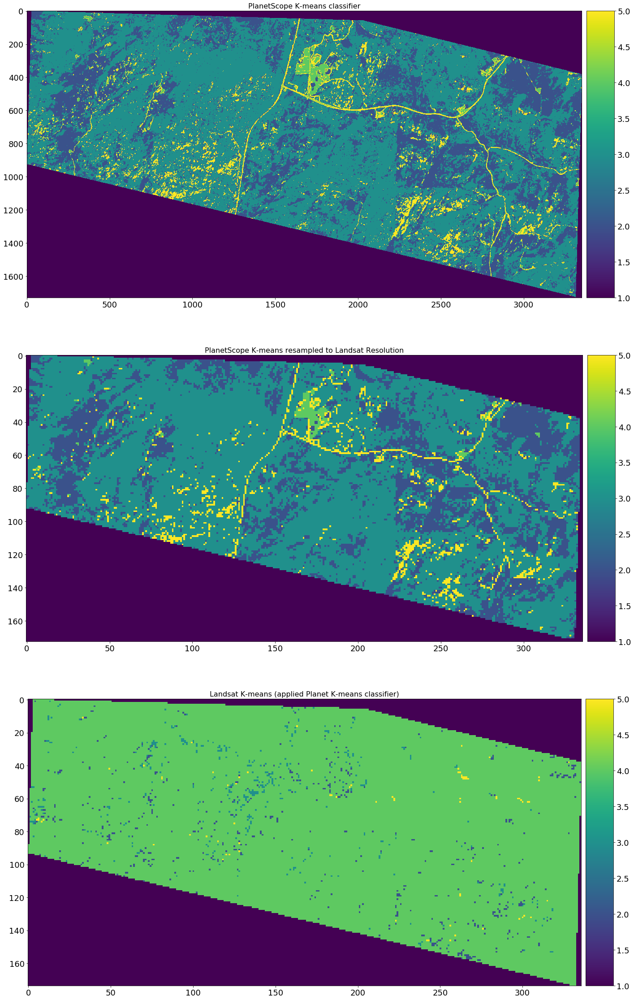

In [43]:
# do a majority resampling of the planet data

pl_resamp = majority_agg(pred_data_pl_pl, 10)


fig, ax = plt.subplots(3,1, figsize = (40,40))
c = ax[0].imshow(pred_data_pl_pl)
ax[0].set_title('PlanetScope K-means classifier')
colorbar(c)
c = ax[1].imshow(pl_resamp, vmin=1)
ax[1].set_title('PlanetScope K-means resampled to Landsat Resolution')
colorbar(c)
c = ax[2].imshow(pred_data_pl_l8)
ax[2].set_title('Landsat K-means (applied Planet K-means classifier)')
colorbar(c)
plt.show()
    

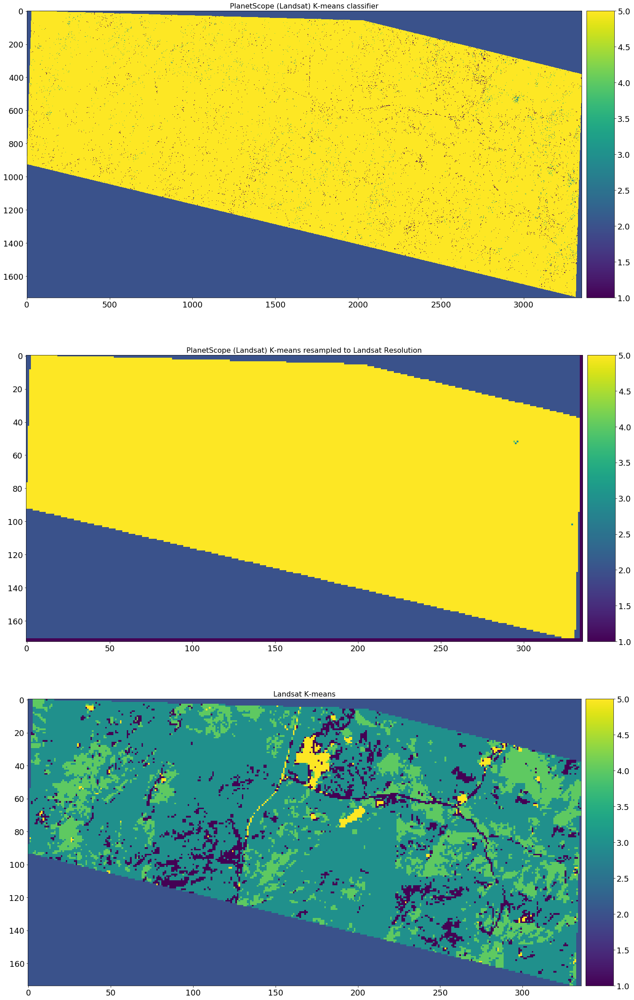

In [44]:
# do a majority resampling of the planet data

pl_resamp_l8 = majority_agg(pred_data_l8_pl, 10)


fig, ax = plt.subplots(3,1, figsize = (40,40))
c = ax[0].imshow(pred_data_l8_pl)
ax[0].set_title('PlanetScope (Landsat) K-means classifier')
colorbar(c)
c = ax[1].imshow(pl_resamp_l8, vmin=1)
ax[1].set_title('PlanetScope (Landsat) K-means resampled to Landsat Resolution')
colorbar(c)
c = ax[2].imshow(pred_data_l8_l8)
ax[2].set_title('Landsat K-means')
colorbar(c)
plt.show()
    

In [45]:
import matplotlib

norm = matplotlib.colors.Normalize(vmin=1, vmax=nclass)
cmap = matplotlib.cm.get_cmap('Spectral')
cmap(7)

(0.67881584006151485, 0.069588619761630138, 0.27281814686658978, 1.0)

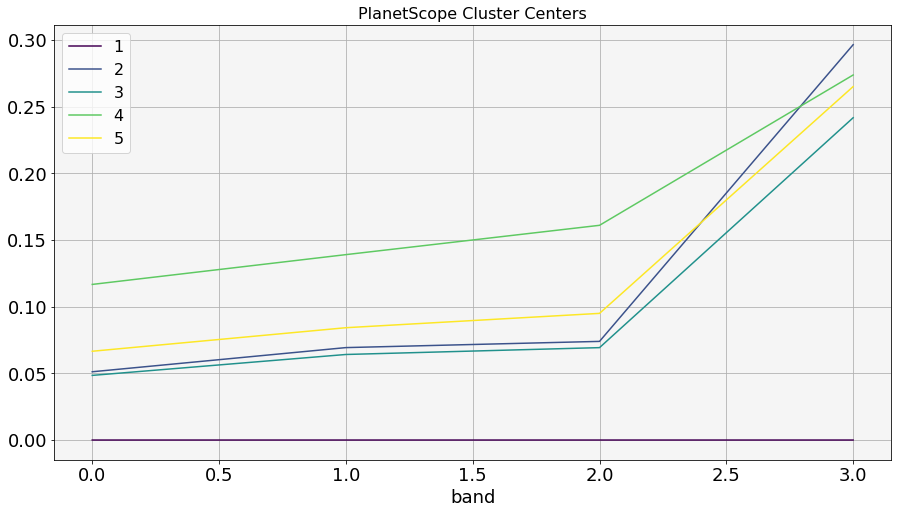

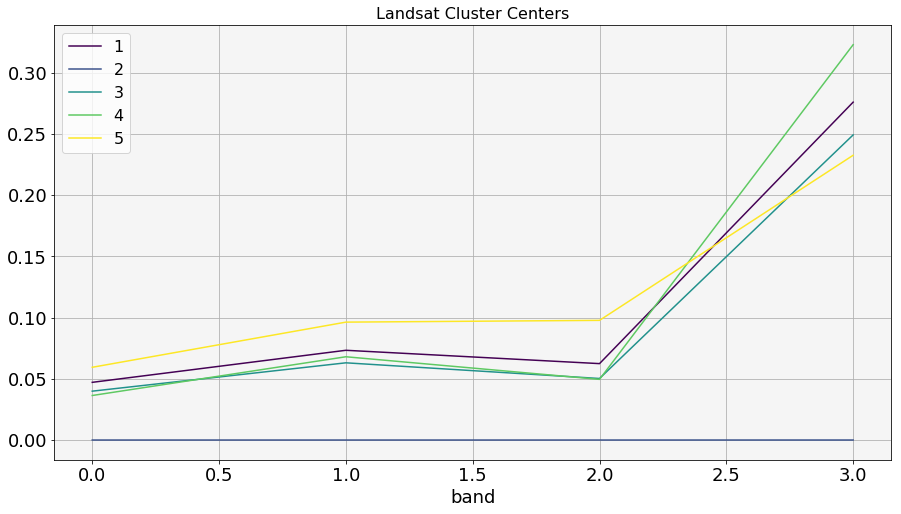

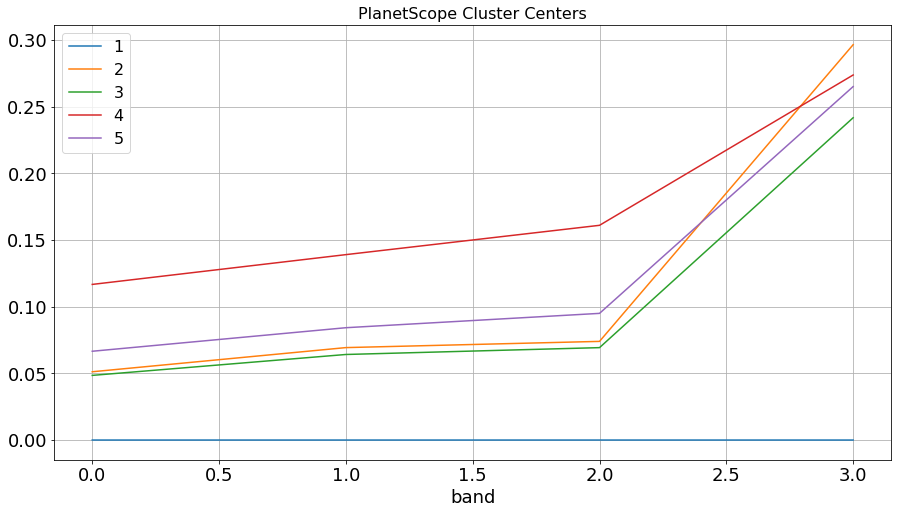

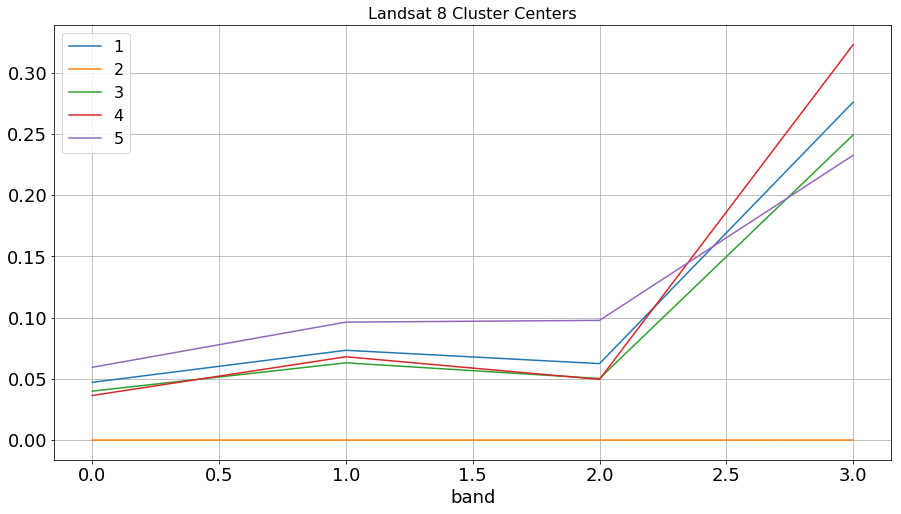

In [46]:
## plot the cluster centers for the Planet and Landsat classifiers
pl_centers = clf_pl.means_
l8_centers = clf_l8.means_

from matplotlib import pyplot as plt
colors=iter(plt.cm.viridis(np.linspace(0,1,nclass)))

fig, ax = plt.subplots(figsize = (15,8))
labels= [str(i+1) for i in range(pl_centers.shape[0])]
for i,c in enumerate(colors):
    ax.plot(pl_centers[i,:], color=c, label=labels[i])

ax.legend()
ax.set_title('PlanetScope Cluster Centers')
ax.set_xlabel('band')
ax.set_facecolor('whitesmoke')
ax.grid()
plt.show()

fig, ax = plt.subplots(figsize = (15,8))
colors=iter(plt.cm.viridis(np.linspace(0,1,nclass)))
labels= [str(i+1) for i in range(l8_centers.shape[0])]
for i,c in enumerate(colors):
    ax.plot(l8_centers[i,:], color=c, label=labels[i])

ax.legend()
ax.set_title('Landsat Cluster Centers')
ax.set_xlabel('band')
ax.grid()
ax.set_facecolor('whitesmoke')
plt.show()

fig, ax = plt.subplots(figsize = (15,8))
labels= [str(i+1) for i in range(pl_centers.shape[0])]
ax.plot(pl_centers.T)
ax.legend(labels=labels)
ax.set_title('PlanetScope Cluster Centers')
ax.set_xlabel('band')
ax.grid()
plt.show()

fig, ax = plt.subplots(figsize = (15,8))
ax.plot(l8_centers.T)
labels= [str(i+1) for i in range(l8_centers.shape[0])]
ax.legend(labels=labels)
ax.set_title('Landsat 8 Cluster Centers')
ax.set_xlabel('band')
ax.grid()
plt.show()

## not much separability except in the vegetation.. look at EVI


C:\anaconda3\envs\earth-analytics-python\lib\site-packages\sklearn\mixture\base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


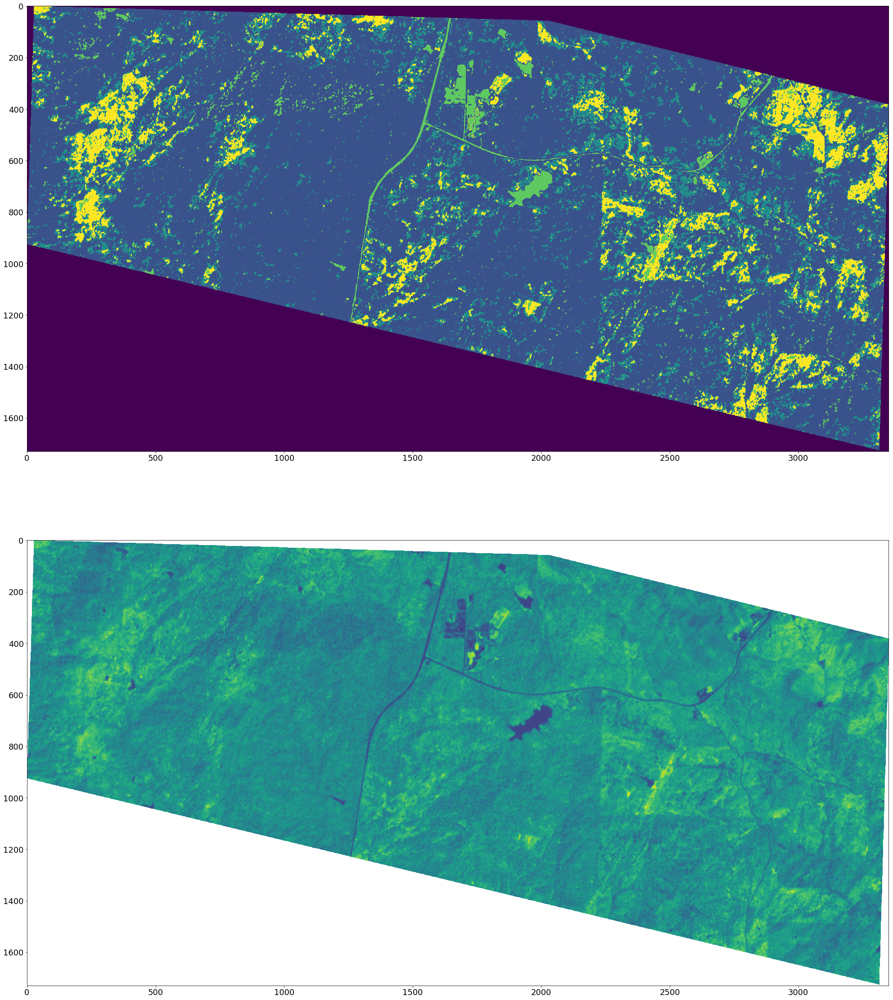

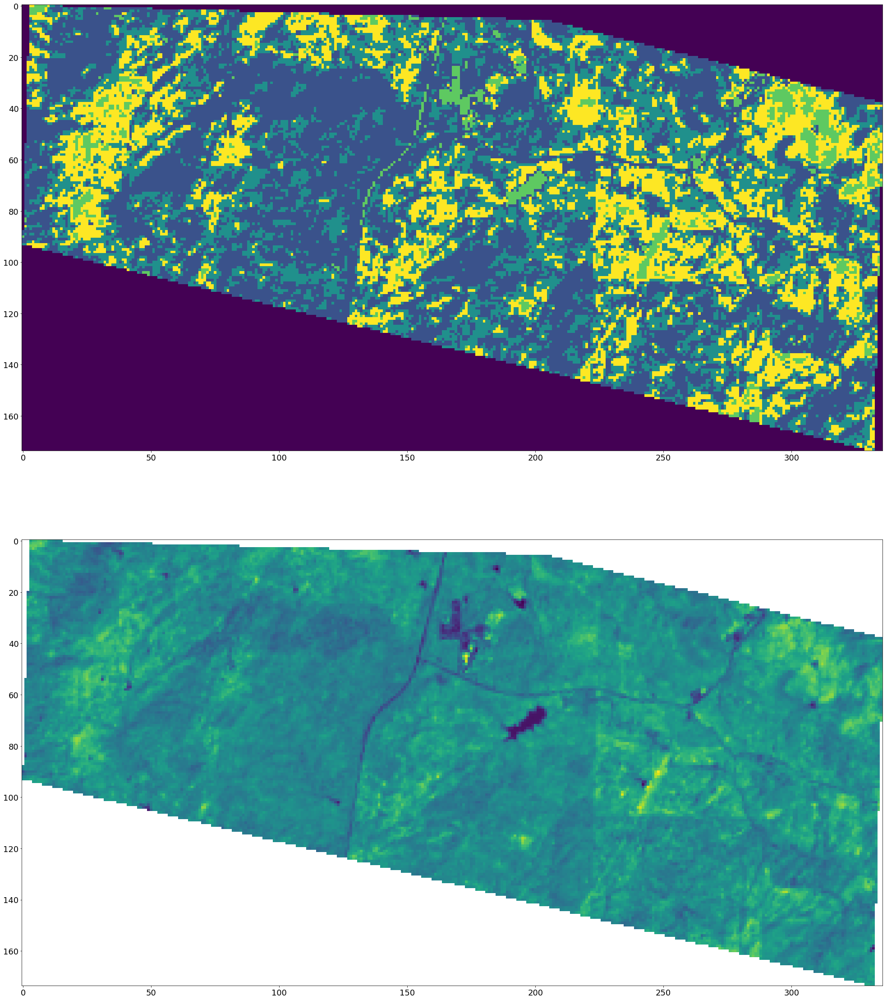

In [47]:
G, C1, C2, L = 2.5, 6., 7.5, 1.
pl_evi_num = G*(pl_arr[:,:,3] - pl_arr[:,:,2])
pl_evi_den = pl_arr[:,:,3] + C1*pl_arr[:,:,2] - C2*pl_arr[:,:,0] + L
pl_evi = pl_evi_num / pl_evi_den

l8_evi_num = G*(l8_arr[:,:,3] - l8_arr[:,:,2])
l8_evi_den = l8_arr[:,:,3] + C1*l8_arr[:,:,2] - C2*l8_arr[:,:,0] + L
l8_evi = l8_evi_num / l8_evi_den


# Define the classifier
clf_pl_evi = BayesianGaussianMixture(n_components=nclass, random_state=10)

# fit it on the first image
# X_pl =  pl_arr.reshape(-1,4)
X_pl = np.expand_dims(pl_evi.ravel(), axis=1)
X_l8 = np.expand_dims(l8_evi.ravel(), axis=1)

# ndvi = np.expand_dims(((TestData[:,3] - TestData[:,2]) / (TestData[:,3] + TestData[:,2])), axis=1)
# ndvi[np.isnan(ndvi)] = -9999
#TestData = np.hstack((TestData, ndvi))
clf_pl_evi.fit(X_pl, y=None)

# use the fit model
predictedClass = clf_pl_evi.predict(X_pl)
predictedClass += 1

## show the result

fig, ax = plt.subplots(2,1, figsize = (40,40))
pred_data_pl_pl_evi = predictedClass.reshape(pl_arr.shape[:2])
ax[0].imshow(pred_data_pl_pl_evi)
ax[1].imshow(pl_evi)
plt.show()



# use the fit model
predictedClass = clf_pl_evi.predict(X_l8)
predictedClass += 1

## show the result

fig, ax = plt.subplots(2,1, figsize = (40,40))
pred_data_pl_l8_evi = predictedClass.reshape(l8_arr.shape[:2])
ax[0].imshow(pred_data_pl_l8_evi)
ax[1].imshow(l8_evi)
plt.show()

C:\anaconda3\envs\earth-analytics-python\lib\site-packages\sklearn\mixture\base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


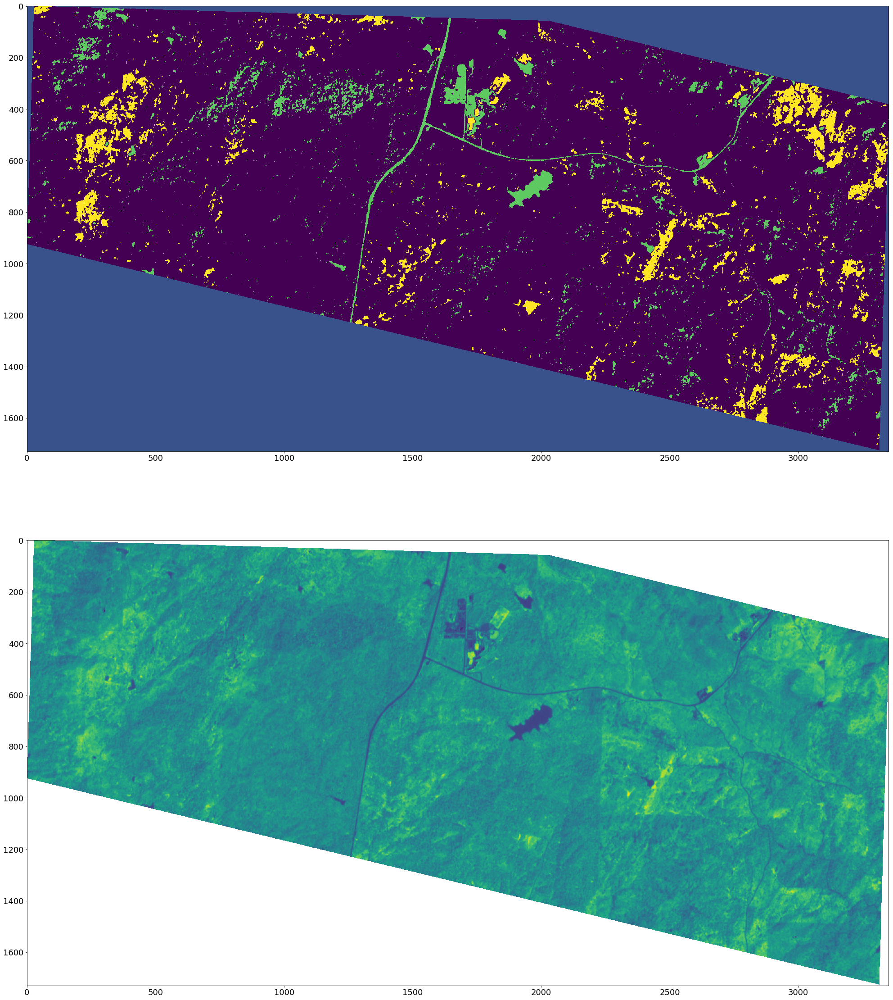

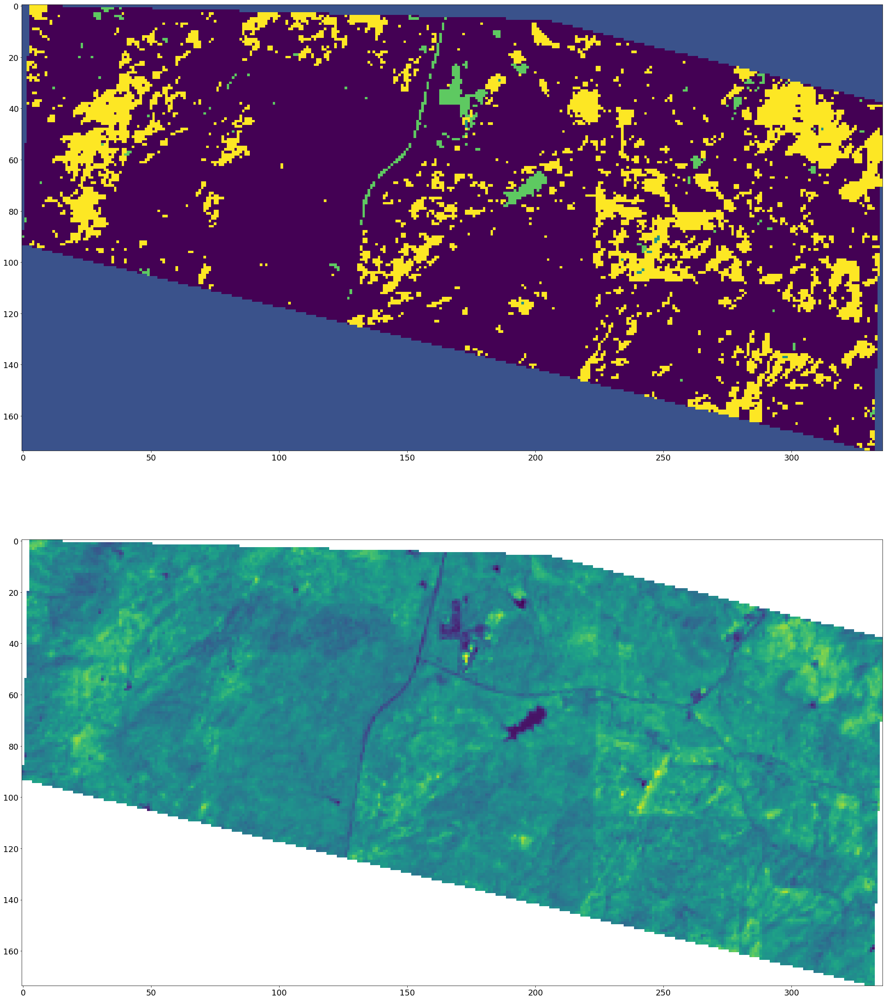

In [48]:
# Define the classifier
clf_l8_evi = BayesianGaussianMixture(n_components=nclass, random_state=10)
clf_l8_evi.fit(X_l8, y=None)

# use the fit model
predictedClass = clf_l8_evi.predict(X_pl)
predictedClass += 1

## show the result

fig, ax = plt.subplots(2,1, figsize = (40,40))
pred_data_l8_pl_evi = predictedClass.reshape(pl_arr.shape[:2])
ax[0].imshow(pred_data_l8_pl_evi)
ax[1].imshow(pl_evi)
plt.show()



# use the fit model
predictedClass = clf_l8_evi.predict(X_l8)
predictedClass += 1

## show the result

fig, ax = plt.subplots(2,1, figsize = (40,40))
pred_data_l8_l8_evi = predictedClass.reshape(l8_arr.shape[:2])
ax[0].imshow(pred_data_l8_l8_evi)
ax[1].imshow(l8_evi)
plt.show()

In [49]:
clf_l8_evi.means_

array([[ 0.39865753],
       [ 2.49991458],
       [ 0.42614509],
       [ 0.33958459],
       [ 0.47559491]])

In [50]:
clf_pl_evi.means_

array([[ 2.49999913],
       [ 0.33232999],
       [ 0.39602572],
       [ 0.34741039],
       [ 0.46247657]])

In [51]:
np.hstack((clf_l8_evi.means_, clf_pl_evi.means_))

array([[ 0.39865753,  2.49999913],
       [ 2.49991458,  0.33232999],
       [ 0.42614509,  0.39602572],
       [ 0.33958459,  0.34741039],
       [ 0.47559491,  0.46247657]])

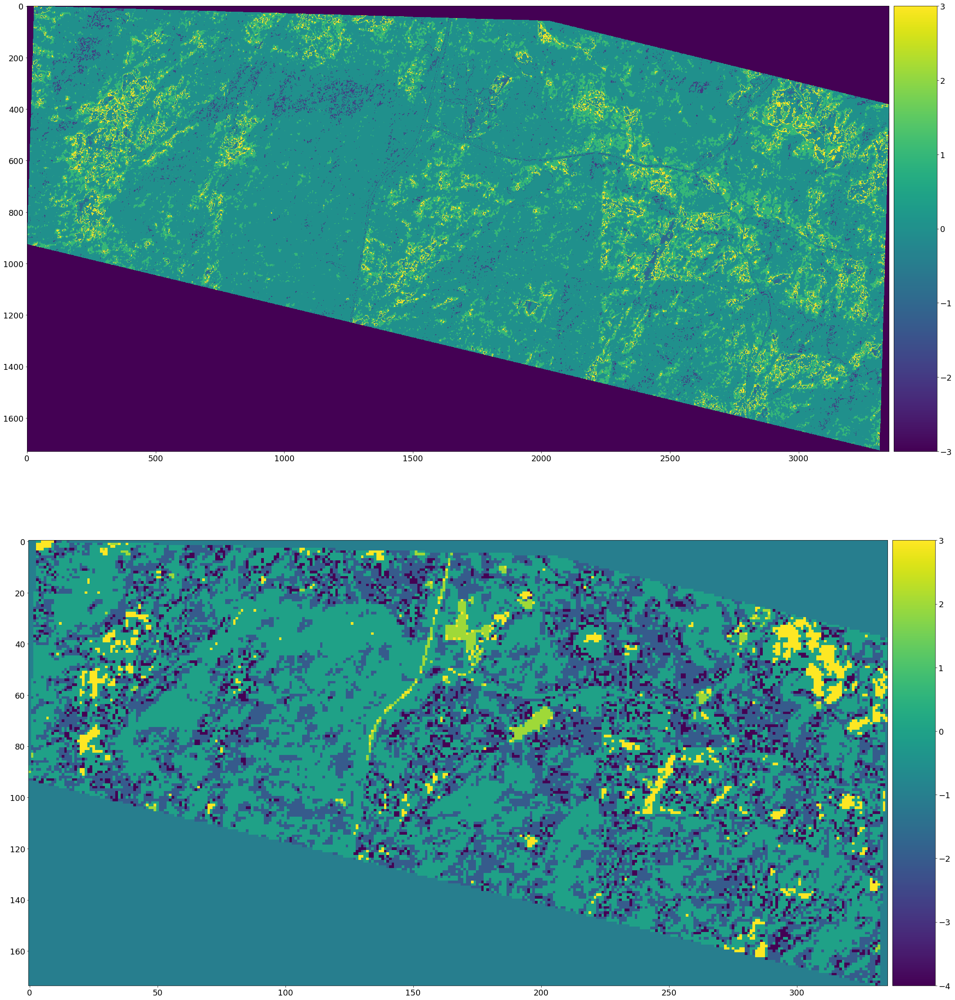

In [52]:
### find the minimum distances between cluster centers for the correct mapping
pl_evi_centers = clf_pl_evi.means_
l8_evi_centers = clf_l8_evi.means_
class_reassign = []
distances = []
for c in pl_evi_centers: 
    # find row in landsat centers closest to current center
    dist = np.linalg.norm(c - l8_evi_centers, axis=1)
    nearest_class = np.argmin(np.abs(dist))
    class_reassign.append(nearest_class +1)
    distances.append(dist)
    
    
# replace the values from the l8 classifier, with the pl values
class_values = np.unique(pred_data_l8_pl_evi)
pl_evi_copy = pred_data_l8_pl_evi.copy()
for i in class_values:
    
    # reassign values
    ind = i-1
    pl_evi_copy[pred_data_l8_pl_evi == i] = class_reassign[ind]


## do the same for landsat

### find the minimum distances between cluster centers for the correct mapping
class_reassign_l8 = []
for c in l8_evi_centers: 
    # find row in landsat centers closest to current center
    dist = np.linalg.norm(c - pl_evi_centers, axis=1)
    nearest_class = np.argmin(np.abs(dist))
    class_reassign_l8.append(nearest_class +1)
    
# replace the values from the Planet classifier applied to the L8 scene, with the nearest L8 class values
class_values = np.unique(pred_data_pl_l8_evi)
l8_evi_copy = pred_data_pl_l8_evi.copy()
for i in class_values:
    
    # reassign values
    ind = i-1
    l8_evi_copy[pred_data_pl_l8_evi == i] = class_reassign_l8[ind]

    
# reshow the difference    
pl_evi_dif = pred_data_pl_pl_evi - pl_evi_copy
l8_evi_dif = pred_data_l8_l8_evi - l8_evi_copy

fig, ax = plt.subplots(2,1, figsize = (40,40))
c = ax[0].imshow(pl_evi_dif)
colorbar(c)
c = ax[1].imshow(l8_evi_dif)
colorbar(c)

In [53]:
class_reassign

[2, 4, 1, 4, 5]

In [54]:
a= pl_evi_centers[np.array(class_reassign_l8)-1]
b=l8_evi_centers

np.hstack((a,b))

array([[ 0.39602572,  0.39865753],
       [ 2.49999913,  2.49991458],
       [ 0.39602572,  0.42614509],
       [ 0.33232999,  0.33958459],
       [ 0.46247657,  0.47559491]])

In [55]:
a= pl_evi_centers
b=l8_evi_centers[np.array(class_reassign)-1]

np.hstack((a,b))

array([[ 2.49999913,  2.49991458],
       [ 0.33232999,  0.33958459],
       [ 0.39602572,  0.39865753],
       [ 0.34741039,  0.33958459],
       [ 0.46247657,  0.47559491]])

## Look at silhoutte plots for planet and landsat k means classifiers

In [56]:
from sklearn.metrics import silhouette_samples, silhouette_score